In [41]:
from accelerate.utils import MODEL_NAME
from transformers import CLIPModel, CLIPProcessor
from datasets import concatenate_datasets
from datasetUtils.load_dataset import get_validation_data, get_candidate_dataset
import os
import torch
import random
from PIL import Image
import json
import numpy as np
import warnings
import textwrap
import skimage
import IPython.display
import matplotlib.pyplot as plt
import matplotlib.patches as patches


from collections import OrderedDict
import torch

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

warnings.filterwarnings('ignore')

In [240]:
MODEL_NAME = 'openai/clip-vit-large-patch14'
dataset_path = 'datasets'

In [26]:
Device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
feature_processor = CLIPProcessor.from_pretrained(MODEL_NAME, cache_dir='model/')

def load_query_instruction():
    prompts_dict = {}
    with open('datasetUtils/query_instructions.tsv', "r") as f:
        next(f)  # Skip the header line
        for line in f.readlines():
            parts = line.strip().split("\t")
            # Construct the key to be dataset_id, query_modality, cand_modality
            key = f"{parts[3]}, {parts[0]}, {parts[1]}"
            prompts = [p for p in parts[4:] if p]  # Filters out any empty prompts
            prompts_dict[key] = prompts

    return prompts_dict

query_instructions = load_query_instruction()

cache_splits = "_".join(['visualnews', 'fashion200k', 'mscoco'])

with open(f"cache/.cache_cand_{cache_splits}.json", 'r') as f:
    candidate_dataset_dict = json.load(f)

queries = get_validation_data(domains=['mscoco','visualnews','fashion200k'])

candidate_dataset = get_candidate_dataset(domains=['mscoco', 'visualnews', 'fashion200k'])

def format_string(s):
    """Strip the string, remove carriage returns, and capitalize the first character."""
    s = (s or "").replace("\r", "").strip().strip('"')
    if s:  # If the string is not empty
        s = s[0].upper() + s[1:]  # Capitalize the first character
        s = s + "." if s[-1] not in [".", "?", "!"] else s  # Add a period at the end of the string
    return s


def get_random_query_prompt(prompts_dict, dataset_id, query_modality, cand_modality):
    key = f"{dataset_id}, {query_modality}, {cand_modality}"
    prompts = prompts_dict.get(key, [])
    assert prompts, f"Cannot find prompts for {key}"
    prompt = format_string(random.choice(prompts))
    assert prompt, f"Prompt is empty for {key}"
    return prompt


def _get_padded_text_with_mask(txt):
    return (txt, 1) if txt not in [None, ""] else ("", 0)

def _get_padded_image_with_mask(img):
    return (img, 1) if img is not None else (torch.zeros((3, 224, 224)), 0)

def load_and_preprocess_image(query_img_path):
    """Load an image given a path"""
    if not query_img_path:
        return None
    image = Image.open(dataset_path + '/' + query_img_path).convert("RGB")
    image = feature_processor(images=image, return_tensors='pt')["pixel_values"].squeeze(0)
    return image


def prepare_data_dict(txt, img_path):
    img = load_and_preprocess_image(img_path)
    return {"txt": txt, "img": img}


def get_random_candidates(dataset_id, modality):
    candidates_1 = candidate_dataset.filter(lambda x: x['did'].startswith(f"{dataset_id}:") and x['modality'] == modality).shuffle().select(range(2))
    candidates_2 = candidate_dataset.filter(lambda x: x['did'].startswith(f"{dataset_id}:") and x['modality'] != modality).shuffle().select(range(2))
    return concatenate_datasets([candidates_1, candidates_2])


Loading validation data for ['mscoco', 'visualnews', 'fashion200k']
Validation with 29860 text and 46561 image retrieval tasks.
Validation domain details: visualnews(39996), fashion200k(6606), mscoco(29819)
Loading candidate data for ['mscoco', 'visualnews', 'fashion200k']


In [232]:
def get_ranking(queries, model):

    model.eval()
    model.to(Device)
    with torch.no_grad():
        for q in queries:
            query_dataset_id = q['qid'].split(":")[0]
            query_modality = q['query_modality']
            pos_cand_did = q['pos_cand_list'][0]
            pos_cand = candidate_dataset_dict[pos_cand_did]
            pos_cand_modality = pos_cand['modality']
            inst_query = get_random_query_prompt(query_instructions, query_dataset_id, query_modality, pos_cand_modality)
            query_txt_with_prompt = format_string(f"{inst_query} {q['query_txt']}")

            query = prepare_data_dict(query_txt_with_prompt, q["query_img_path"])
            positive_candidate = prepare_data_dict(pos_cand['txt'], pos_cand['img_path'])
            random_cand = get_random_candidates(query_dataset_id, pos_cand_modality)
            candidates = [
                    prepare_data_dict(
                        format_string(cand["txt"]),
                        cand["img_path"]
                    )
                    for cand in random_cand
                ]

            candidates.insert(0, positive_candidate)
            instance_keys = ['query', 'candidates']

            batch = [{'query': query,'candidates': candidates}]
            index_mapping = {
                "query": [[]],
            }
            index_mapping.update({"candidates": [[]]})

            txt_list, txt_mask_list, img_list, img_mask_list = [], [], [], []
            counter = 0
            for inst_idx, instance in enumerate(batch):
                for instance_key in instance_keys:
                    items = [instance[instance_key]] if instance_key != 'candidates' else instance[instance_key]  # list
                    for item in items:
                        txt = item["txt"]
                        img = item["img"]

                        index_mapping[instance_key][inst_idx].append(counter)  # Track current index
                        counter += 1
                        padded_txt, txt_mask = _get_padded_text_with_mask(txt)
                        padded_img, img_mask = _get_padded_image_with_mask(img)
                        txt_list.append(padded_txt)
                        img_list.append(padded_img)
                        txt_mask_list.append(txt_mask)
                        img_mask_list.append(img_mask)

            tokenized_text = feature_processor(text=txt_list, padding=True, truncation=True, return_tensors='pt').to(Device)

            txt_batched = tokenized_text['input_ids']
            txt_attention_mask_batched = tokenized_text['attention_mask']

            txt_mask_list = torch.tensor(txt_mask_list, dtype=torch.long, device=Device).unsqueeze(-1)
            img_mask_list = torch.tensor(img_mask_list, dtype=torch.long, device=Device).unsqueeze(-1)

            txt_emb = model.get_text_features(txt_batched, txt_attention_mask_batched) * txt_mask_list
            img_emb = model.get_image_features(torch.stack(img_list, dim=0)) * img_mask_list
            embeddings = img_emb + txt_emb

            q_embeds = embeddings[torch.tensor(index_mapping["query"]).flatten()]
            cand_embeds = embeddings[torch.tensor(index_mapping["candidates"]).flatten()]

            scores = (q_embeds @ cand_embeds.transpose(0, 1)).cpu().numpy()[0]

            top_ids = np.argsort(scores)[::-1]
            print(scores)
            print(top_ids)
            
            if q["query_img_path"] not in ['', None]:
                print(f"Prompt: {inst_query}\n")
                plt.imshow(Image.open(dataset_path + '/' + q["query_img_path"]).convert("RGB"))
                plt.axis('off')
                plt.show()
            else:
                print(f"Prompt: {query_txt_with_prompt}\n")
                

            candidate_images = [pos_cand['img_path']] + [cand['img_path'] for cand in random_cand]
            candidate_texts = [pos_cand['txt']] + [cand['txt'] for cand in random_cand]
            
            positive_image = candidate_images[0]
            positive_txt = candidate_texts[0]
            
            candidate_images = [candidate_images[idx] for idx in top_ids]
            candidate_texts = [candidate_texts[idx] for idx in top_ids]
            
            images = [Image.open(dataset_path + '/' + img_path).convert("RGB") if img_path != None else None for
                      img_path in candidate_images]

            fig, axes = plt.subplots(1, len(images), figsize=(15, 5))
            # fig.suptitle(''.join([f'Rank {i+1}'+' '*45 for i in range(len(images))]), fontsize=12, y=0.95)
            for ax, (idx, img) in zip(axes, enumerate(images)):
                ax.set_title(f"Rank {idx+1}")
                if img is not None:
                    ax.imshow(img)
                    if positive_image:
                        if img == Image.open(dataset_path + '/' + positive_image).convert("RGB"):
                            width, height = img.size
                            rect1 = patches.Rectangle((0, 0), width, height, linewidth=25, edgecolor='white', facecolor='none')
                            rect2 = patches.Rectangle((0, 0), width, height, linewidth=5, edgecolor='green', facecolor='none')
                            ax.add_patch(rect1)
                            ax.add_patch(rect2)
                else:
                    text = candidate_texts[idx]
                    
                    if positive_txt and text == positive_txt:
                        ax.text(0.5, 0.7, "\n".join(textwrap.wrap(text, width=30)), fontsize=10, ha='center', va='center',color='black', 
                                bbox=dict(facecolor='white', edgecolor='green', boxstyle='square,pad=1.1'))
                    else:
                        ax.text(0.5, 0.7, "\n".join(textwrap.wrap(text, width=30)), fontsize=10, ha='center', va='center',color='black')
                
            for a in axes:
                a.set_aspect('equal') 
                a.axis('off')
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
            plt.show()
                

In [8]:
total_examples_count = 5

In [175]:
HF_CLIP = CLIPModel.from_pretrained(MODEL_NAME, cache_dir="model/")

# ## Update run number here for the random trained clip model
# RAND_CLIP = CLIPModel.from_pretrained("", cache_dir="model/")
#
# ## Update run number here for the hard negative trained clip model
# HARD_NEG_CLIP = CLIPModel.from_pretrained("", cache_dir="model/")
#
# ## Update run number here for the model tuned after the Random model fine-tuning 4 or 3 epochs (whichever is better)
# HARD_NEG_FT = CLIPModel.from_pretrained("", cache_dir="model/")

task_1_queries = queries.filter(lambda x: x['query_modality'] == 'text').select(range(total_examples_count))

task_4_queries = queries.filter(lambda x: x['query_modality'] == 'image').select(range(total_examples_count))

[61.952415 17.96584   6.236887 53.430035 57.95192 ]
[0 4 3 1 2]
Prompt: Display an image that best captures the following caption from the news. Dale Earnhardt celebrating his final title with his wife Teresa won seven championships He was from Kannapolis NC.



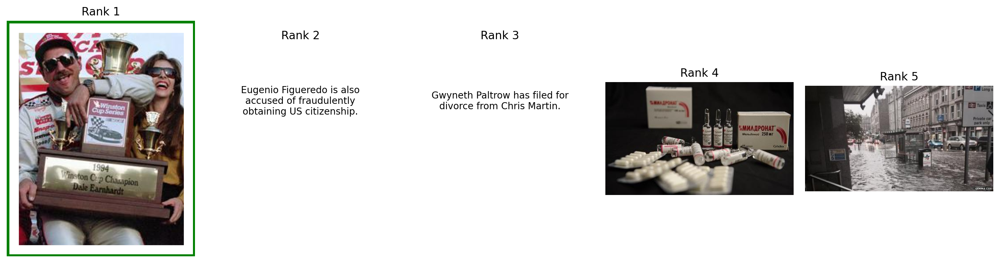

[74.27195  26.987024 11.792379 55.99597  50.35261 ]
[0 3 4 1 2]
Prompt: Based on the caption, provide the most fitting image for the news story. Stranded passengers at Gatwick airport.



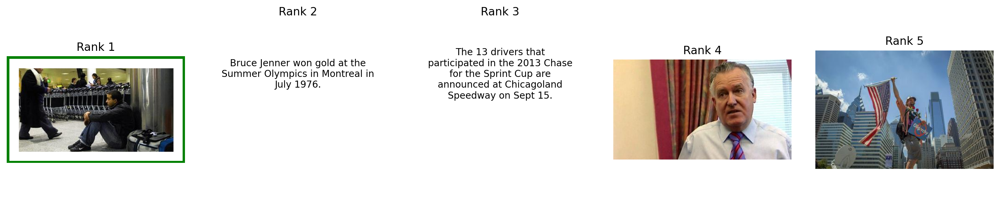

[ 63.27249   40.49463   31.880985 116.04196   34.555897]
[3 0 1 4 2]
Prompt: Identify the news-related image in line with the described event. Philip Seymour Hoffman was a nurse to Jason Robards s ailing character in the film Magnolia.



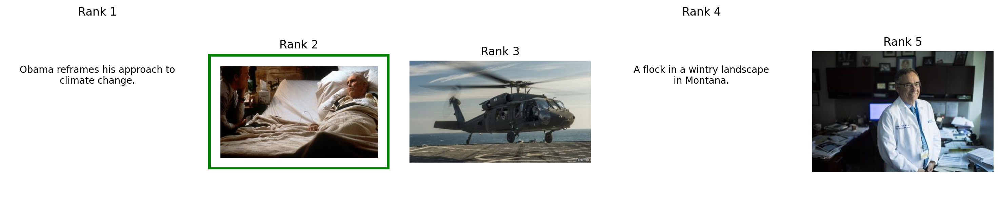

[57.38312  10.831396  9.303475 22.753864 25.174484]
[0 4 3 1 2]
Prompt: I want you to retrieve an image of this daily life description. A sign indicating the historical site that is the Nathan Hale Homestead.



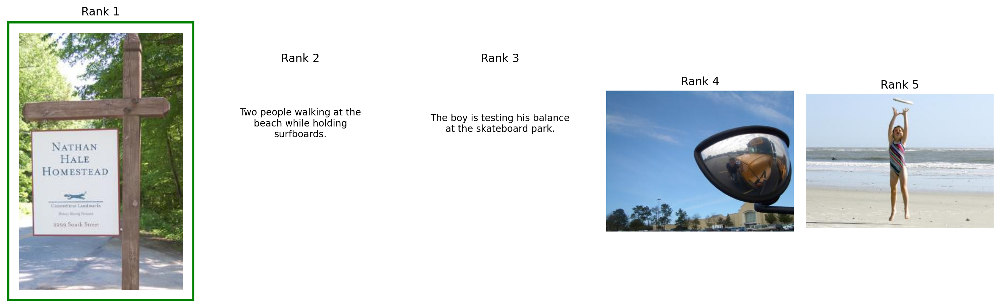

[56.426216 17.739424  9.453714 61.27764  85.49086 ]
[4 3 0 1 2]
Prompt: I want you to retrieve an image of this daily life description. A large mural on a building at an intersection.



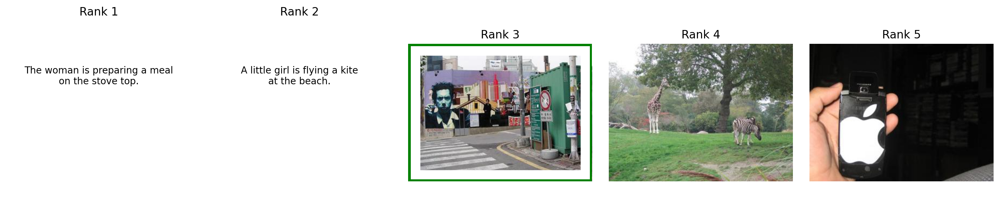

In [239]:
get_ranking(task_1_queries, HF_CLIP)

[77.67508  71.69068  95.38836  76.953926 60.859394]
[2 0 3 1 4]
Prompt: Provide a news-related caption for the displayed image.



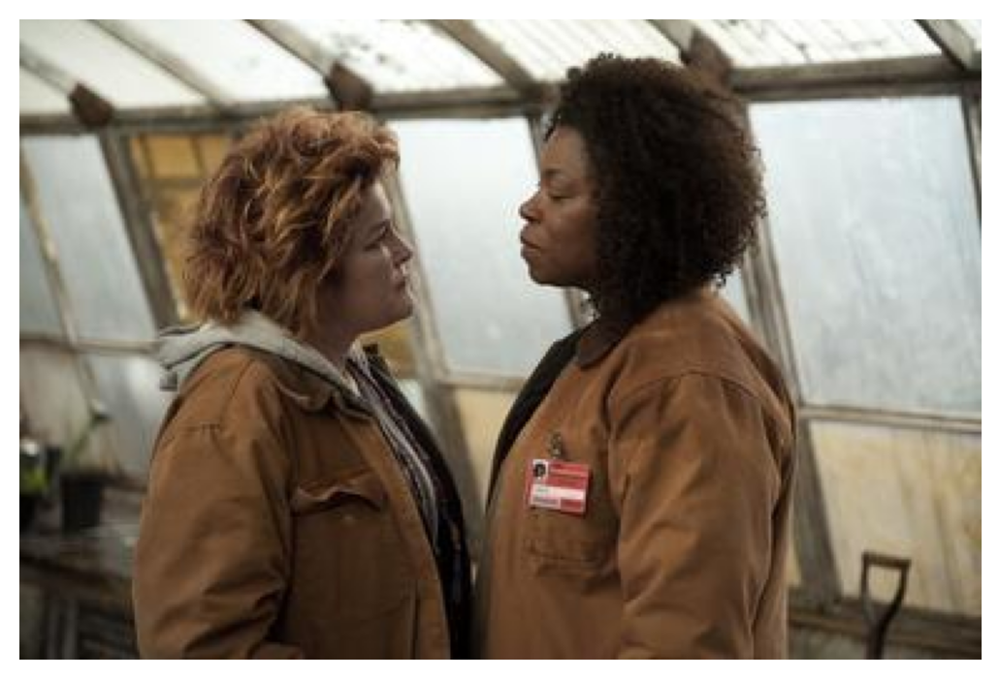

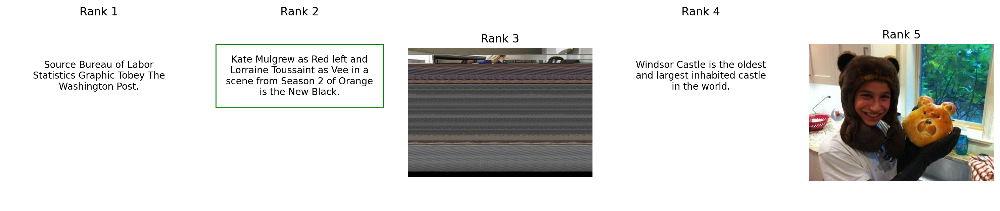

[ 78.45385   82.389694  46.346725 136.51773  137.77945 ]
[4 3 1 0 2]
Prompt: Find a product description for the fashion item in the image.



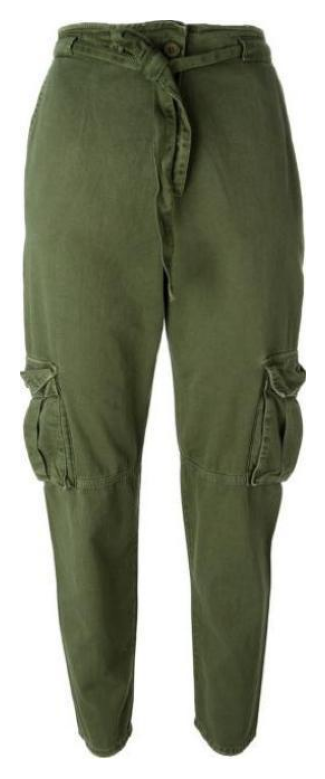

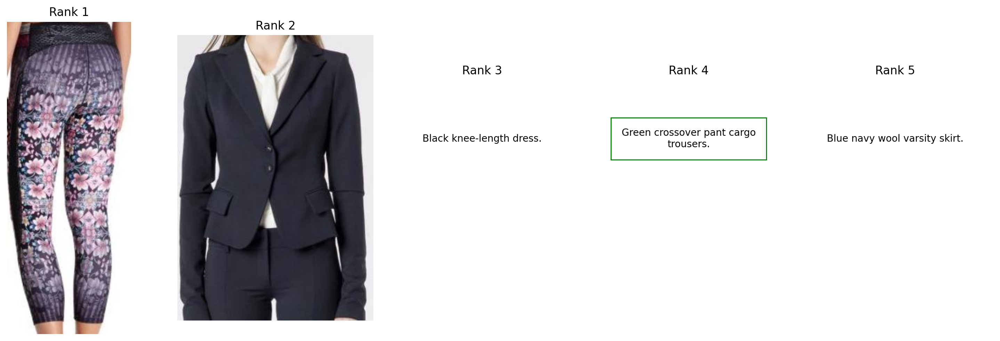

[ 55.974354  46.863102  44.08769  141.58     125.57277 ]
[3 4 0 1 2]
Prompt: Based on the displayed image, retrieve the corresponding fashion description.



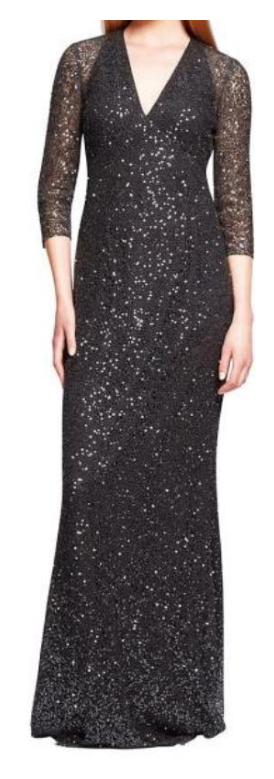

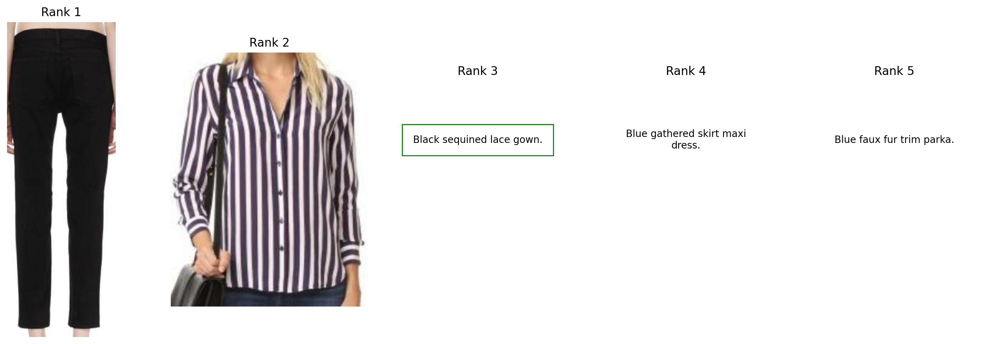

[ 40.21614   63.787388  42.60858  104.281105  85.12503 ]
[3 4 1 2 0]
Prompt: I want to know the caption for this news image.



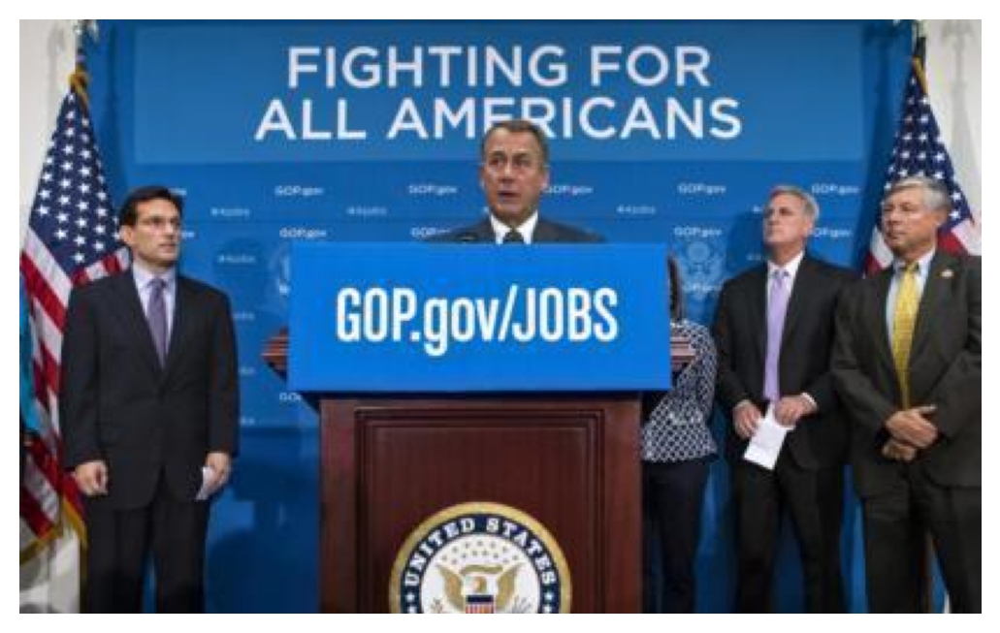

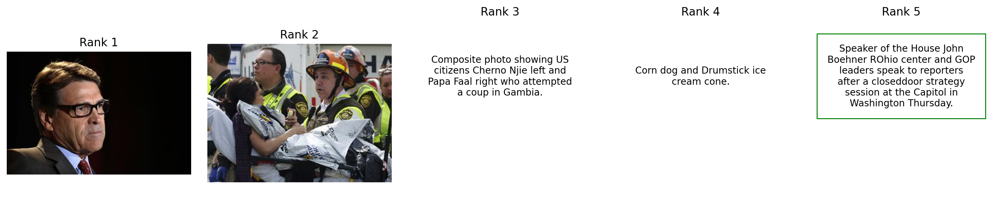

[110.91039    8.607465  61.794632  54.71962   79.47384 ]
[0 4 2 3 1]
Prompt: I want to know the caption for this news image.



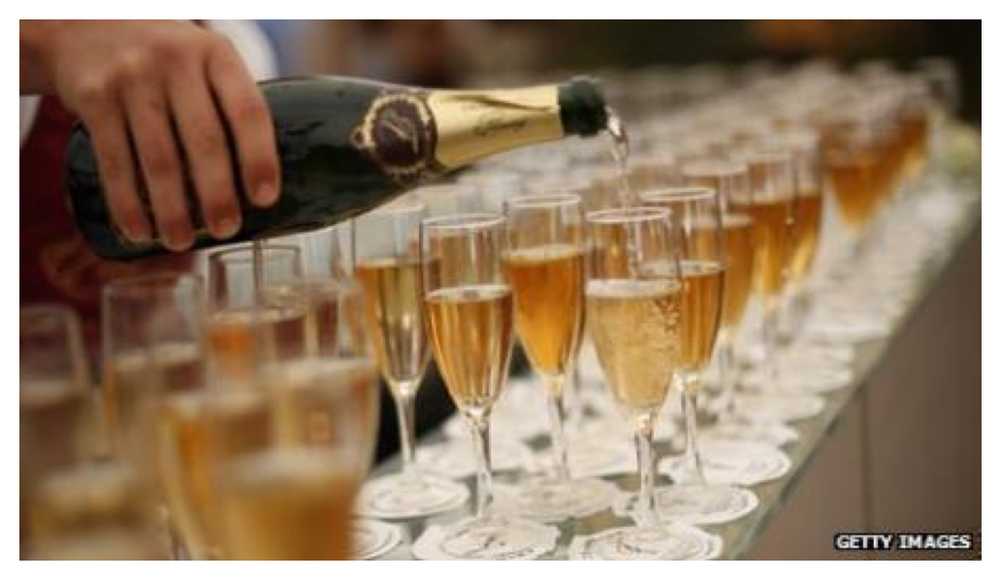

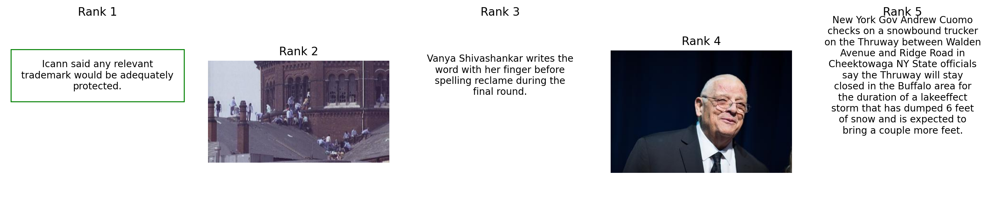

In [233]:
get_ranking(task_4_queries, HF_CLIP)